In [141]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy
import pygwalker as pyg
import math
import geopandas as gpd
from scipy import stats
import pingouin as pg

In [31]:
properties = pd.read_csv("../data/cleaned/properties.csv")

In [38]:
def count_outliers_and_non_outliers(df, columns):
    counts = {"Variable": [], "Non-Outliers": [], "Outliers": []}
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        non_outliers_count = len(df[(df[col] >= lower_bound) & (df[col] <= upper_bound)])
        outliers_count = len(df[(df[col] < lower_bound) | (df[col] > upper_bound)])
        counts["Variable"].append(col)
        counts["Non-Outliers"].append(non_outliers_count)
        counts["Outliers"].append(outliers_count)
    return pd.DataFrame(counts)

In [129]:
def remove_outliers(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

In [23]:
house_properties = properties[properties["property_type"] == "HOUSE"]
house_properties.pop("longitude")
house_properties.pop("latitude")
apartment_properties = properties[properties["property_type"] == "APARTMENT"]
apartment_properties.pop("longitude")
apartment_properties.pop("latitude")

0        51.217172
4        50.822456
5        51.041813
8        51.222544
10       50.818858
           ...    
17251    50.633501
17252    50.838472
17255    51.185968
17256    51.079377
17257    50.583152
Name: latitude, Length: 8926, dtype: float64

# Map

In [134]:
be=gpd.read_file("../data/cleaned/BEL_adm2.shp")
be['coords'] = be['geometry'].apply(lambda x: x.representative_point().coords[:])
be['coords'] = [coords[0] for coords in be['coords']]
fig, ax = plt.subplots(figsize = (18,18))

f=be.plot(ax=ax,column='NAME_2',cmap='GnBu',edgecolor='cyan' )
f.axis('off')
for idx, row in be.iterrows():
   plt.annotate(row['NAME_2'], xy=row['coords'], horizontalalignment='center', color='black')

DataSourceError: Unable to open ../data/cleaned/BEL_adm2.shx or ../data/cleaned/BEL_adm2.SHX. Set SHAPE_RESTORE_SHX config option to YES to restore or create it.

In [ ]:
#Mapping the datapoints in our dataset geographically
be=gpd.read_file("../data/cleaned/BEL_adm2.shp")
be['coords'] = be['geometry'].apply(lambda x: x.representative_point().coords[:])
be['coords'] = [coords[0] for coords in be['coords']]
fig, ax = plt.subplots(figsize = (18,18))

f=be.plot(ax=ax,column='NAME_2',cmap='GnBu',edgecolor='darkcyan')
for idx, row in be.iterrows():
   plt.annotate(row['NAME_2'], xy=row['coords'], horizontalalignment='center', color='black')

house_gdf = gpd.GeoDataFrame(
    properties, geometry=gpd.points_from_xy(properties.longitude, properties.latitude), crs="EPSG:4326")
f.axis('off')

#grps=house_gdf.groupby('province')
house_gdf.plot(ax=f,legend=True,markersize=0.5,color='darkorange')
plt.title('Distribution of datapoints')

# How many observations and features do you have?

In [69]:
# Get the number of observations and features after clean the data.
observations, features = properties.shape

print(f'Number of observations (rows): {observations}')
print(f'Number of features (columns): {features}')

Number of observations (rows): 17258
Number of features (columns): 24


Before Data cleaing 
- Number of  (rows): 75511
- Number of (columns): 30


After Data cleaing 
- Number of (rows): 17258
- Number of (columns): 24

## Observations

In [71]:
properties.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17258 entries, 0 to 17257
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              17258 non-null  int64  
 1   price                           17258 non-null  float64
 2   property_type                   17258 non-null  object 
 3   subproperty_type                17258 non-null  object 
 4   region                          17258 non-null  object 
 5   province                        17258 non-null  object 
 6   locality                        17258 non-null  object 
 7   zip_code                        17258 non-null  int64  
 8   latitude                        17258 non-null  float64
 9   longitude                       17258 non-null  float64
 10  construction_year               17258 non-null  int64  
 11  total_area_sqm                  17258 non-null  float64
 12  nbr_bedrooms                    

In [72]:
properties.shape

(17258, 24)

In [74]:
# Displays the first 5 rows

properties.head()

,id,price,property_type,subproperty_type,region,province,locality,zip_code,latitude,longitude,...,fl_furnished,fl_open_fire,terrace_sqm,garden_sqm,fl_swimming_pool,fl_floodzone,state_building,primary_energy_consumption_sqm,fl_double_glazing,price_per_sqm
0,34221000,225000.0,APARTMENT,APARTMENT,Flanders,Antwerp,Antwerp,2050,51.217172,4.379982,...,0,0,5.0,0.0,0,0,MISSING,231.0,1,2250.00
1,58496000,501000.0,HOUSE,HOUSE,Flanders,Antwerp,Turnhout,2275,51.238312,4.817192,...,0,0,0.0,0.0,0,1,MISSING,99.0,0,2679.14
2,58028000,3500000.0,HOUSE,VILLA,Flanders,West Flanders,Brugge,8300,51.353323,3.296353,...,0,0,0.0,0.0,0,0,TO_RENOVATE,394.0,0,12635.38
3,10079000,549000.0,HOUSE,VILLA,Flanders,East Flanders,Dendermonde,9240,51.065914,3.987321,...,0,0,0.0,0.0,0,0,AS_NEW,142.0,1,2967.57
4,33039000,175000.0,APARTMENT,FLAT_STUDIO,Brussels-Capital,Brussels,Brussels,1160,50.822456,4.406917,...,0,0,0.0,0.0,0,0,GOOD,265.0,1,4605.26


In [75]:
# Displays the last 5 rows
properties.tail()

,id,price,property_type,subproperty_type,region,province,locality,zip_code,latitude,longitude,...,fl_furnished,fl_open_fire,terrace_sqm,garden_sqm,fl_swimming_pool,fl_floodzone,state_building,primary_energy_consumption_sqm,fl_double_glazing,price_per_sqm
17253,29899000,490000.0,HOUSE,HOUSE,Flanders,Flemish Brabant,Leuven,3200,50.970807,4.840489,...,0,1,0.0,0.0,0,0,MISSING,477.0,0,2355.77
17254,36688000,265000.0,HOUSE,HOUSE,Wallonia,Liège,Waremme,4280,50.696639,5.129448,...,0,0,15.0,364.0,0,1,GOOD,494.0,1,1606.06
17255,67748000,255000.0,APARTMENT,APARTMENT,Flanders,Antwerp,Antwerp,2600,51.185968,4.442665,...,0,0,9.0,0.0,0,1,GOOD,161.0,1,2428.57
17256,57381000,285000.0,APARTMENT,APARTMENT,Flanders,Limburg,Hasselt,3580,51.079377,5.226001,...,0,1,0.0,0.0,0,0,MISSING,91.0,1,1540.54
17257,22018000,199000.0,APARTMENT,APARTMENT,Wallonia,Liège,Liège,4100,50.583152,5.506517,...,0,0,7.0,0.0,0,0,GOOD,217.0,1,2235.96


In [78]:
properties[['price']].describe()

,price
count,1.725800e+04
mean,4.231894e+05
std,4.012536e+05
min,7.700000e+04
25%,2.390000e+05
50%,3.250000e+05
75%,4.673750e+05
max,1.145000e+07


In [79]:
walker=pyg.walk(properties)

Box(children=(HTML(value='\n<div id="ifr-pyg-000625166d35eba068HBnpaD71yRTevh" style="height: auto">\n    <hea…

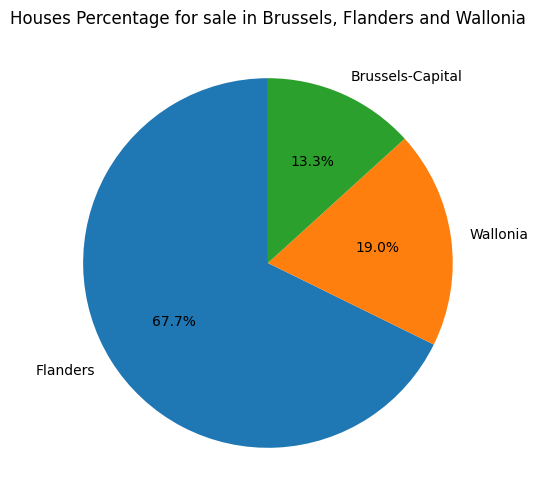

In [80]:
# Count the number of houses per region
counts = properties['region'].value_counts()  # Replace 'region_column_name' with the name of your region column

# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Houses Percentage for sale in Brussels, Flanders and Wallonia')
plt.show() 

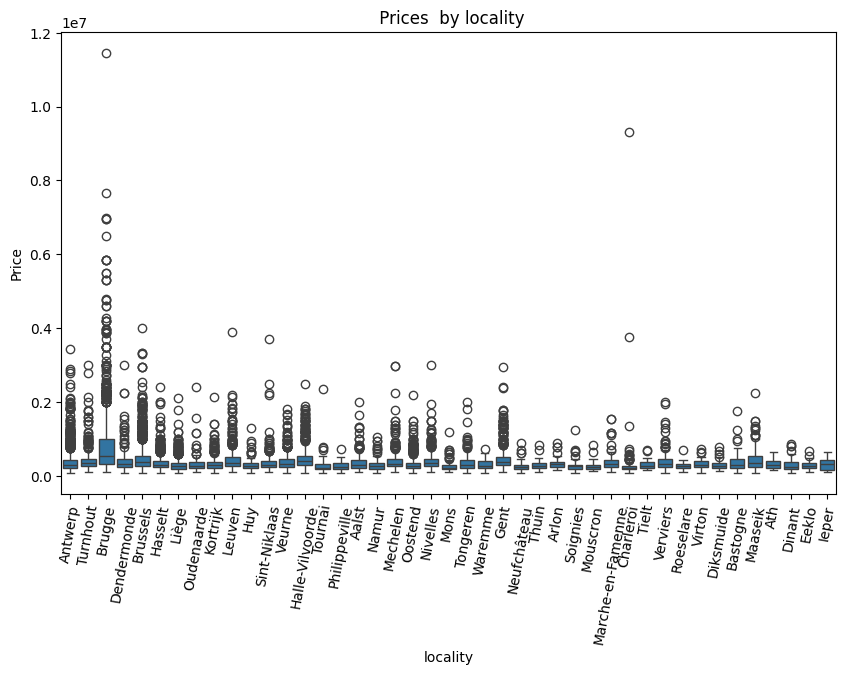

In [81]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='locality', y='price', data=properties)
plt.xlabel('locality')
plt.ylabel('Price')
plt.title(' Prices  by locality')
plt.xticks(rotation=80)
plt.show()

<Axes: xlabel='property_type', ylabel='count'>

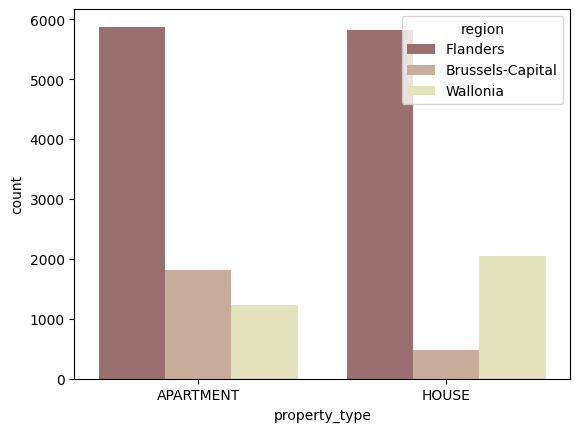

In [82]:
#type of properties for sale and rent in region

sns.countplot(x="property_type",hue="region",data=properties,palette='pink')

# What is the proportion of missing values per column?

In [133]:
raw_properties = pd.read_csv("../data/raw/properties.csv")
# Calculate the proportion of missing values per column
missing_proportion = raw_properties.isnull().mean()

# Display the result as a percentage
missing_percentage = missing_proportion * 100
print(missing_percentage)

id                                 0.000000
price                              0.000000
property_type                      0.000000
subproperty_type                   0.000000
region                             0.000000
province                           0.000000
locality                           0.000000
zip_code                           0.000000
latitude                          18.670128
longitude                         18.670128
construction_year                 44.220047
total_area_sqm                    10.084623
surface_land_sqm                  48.014197
nbr_frontages                     34.890281
nbr_bedrooms                       0.000000
equipped_kitchen                   0.000000
fl_furnished                       0.000000
fl_open_fire                       0.000000
fl_terrace                         0.000000
terrace_sqm                       17.401438
fl_garden                          0.000000
garden_sqm                         3.892148
fl_swimming_pool                

# Which variables would you delete and why?

Report: Variable Deletion in Real Estate Dataset for Immo Eliza
Overview

During this review, certain variables were identified as redundant or irrelevant for our specific objectives and were therefore removed. This report provides a detailed explanation of the variables that were deleted and the reasons behind these decisions.
Deleted Variables and Reasons
1.	Surface_land:
o	Reason for Deletion: This variable refers to the total surface area of the land associated with a property. However, it does not provide information regarding the number of floors or levels within a property, which may be more relevant for determining the overall usable space in multi-story properties. Therefore, it was deemed less critical for our prediction model.
2.	Nbf Frontages:
o	Reason for Deletion: The number of frontages, which refers to the sides of the building that face the street, was considered less relevant for price prediction, especially given the focus on other factors that directly influence property value, such as location, size, and amenities.
3.	Terrace sqm:
o	Reason for Deletion: The area of the terrace (in square meters) was considered redundant as we already have a general indicator of whether a terrace exists or not through another variable. Including both would add unnecessary complexity without significantly improving the model’s accuracy.
4.	Cadastral Home:
o	Reason for Deletion: The cadastral information typically relates to legal descriptions and property identification for tax purposes. While it can be useful for understanding property ownership and legal attributes, it is not directly related to factors that influence market prices, such as location, size, and amenities. Thus, it was removed to focus on more price-relevant data.

5.	Terrace Area:
o	Reason for Deletion: The area of a terrace, measured in square meters, was considered redundant since the presence or absence of a terrace is already captured by another variable. This variable’s removal simplifies the model without losing critical information about the presence of a terrace.
6.	Garden Area:
o	Reason for Deletion: The garden area was excluded for similar reasons as the terrace area. While it does indicate additional outdoor space, the model aims to prioritize variables that have a stronger impact on property price estimation. Additionally, the presence of a garden is still acknowledged in other indicators.
7.	Latitude & Longitude:
o	Reason for Deletion: Latitude and longitude provide precise location data, which is useful for spatial analysis. However, our model can rely on broader location indicators like city or neighborhood to predict price trends. Including latitude and longitude could add unnecessary complexity without offering significant benefits for price prediction at this stage.
Rationale for Variable Reduction

Removing these variables is expected to:
•	Improve Model Simplicity: Fewer variables reduce model complexity, which can lead to better interpretability and faster computation.
•	Focus on Key Features: Concentrating on variables that have a more direct impact on property prices will help refine the accuracy of predictions.

# What variables are most subject to outliers?

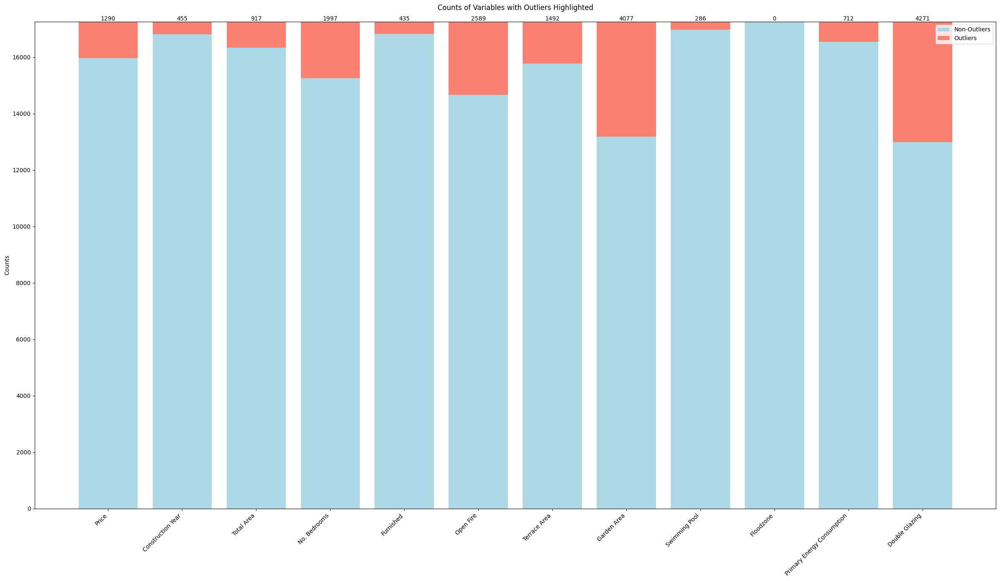

In [115]:
df = properties.select_dtypes(np.number)
df.pop("id")
df.pop("zip_code")
df.pop("latitude")
df.pop("longitude")
df.pop("price_per_sqm")

counts_df = count_outliers_and_non_outliers(df, df.columns)

plt.figure(figsize=(24, 14))
bars1 = plt.bar(counts_df["Variable"], counts_df["Non-Outliers"], label='Non-Outliers', color='lightblue')
bars2 = plt.bar(counts_df["Variable"], counts_df["Outliers"], bottom=counts_df["Non-Outliers"], label='Outliers', color='salmon')

for bar in bars2:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_y() + height + 1, int(height), ha='center', va='bottom', fontsize=10)

x_axis_labels = ["Price", "Construction Year", "Total Area", "No. Bedrooms", "Furnished", "Open Fire", 
                 "Terrace Area", "Garden Area", "Swimming Pool", "Floodzone", "Primary Energy Consumption", "Double Glazing"]

plt.ylabel('Counts')
plt.title('Counts of Variables with Outliers Highlighted', pad=20)
plt.xticks(ticks=range(len(x_axis_labels)), labels=x_axis_labels, rotation=45, ha="right")
plt.legend()

plt.tight_layout()
plt.show()

## Houses

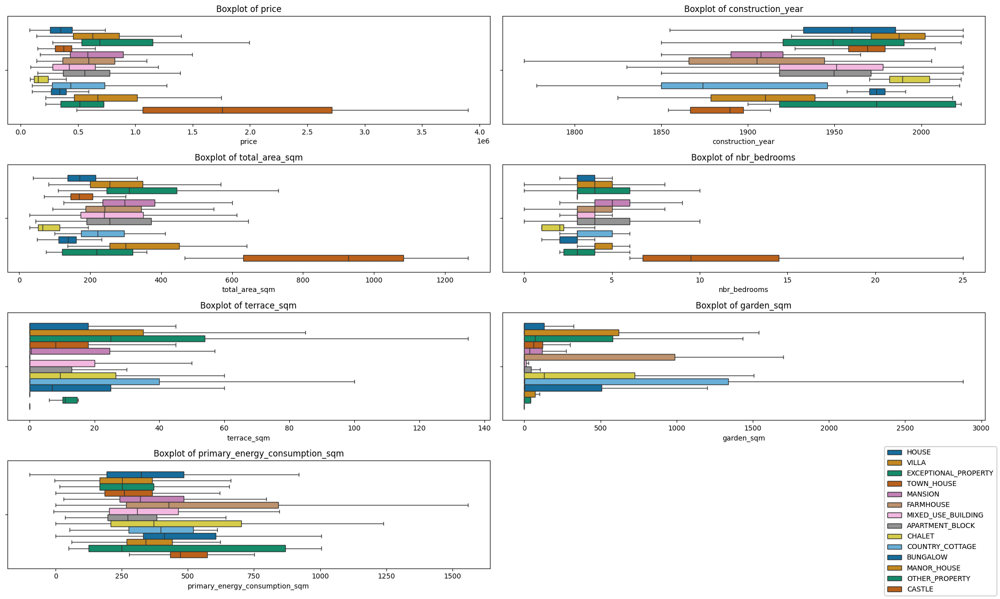

In [37]:
df = house_properties.select_dtypes(np.number)
df.pop("id")
df.pop("zip_code")
df.pop("fl_swimming_pool")
df.pop("fl_furnished")
df.pop("fl_open_fire")
df.pop("fl_floodzone")
df.pop("fl_double_glazing")
df["subproperty_type"] = house_properties["subproperty_type"]
plt.figure(figsize=(20, 12))
for i, col in enumerate(df.columns[:-1]):
    ax = plt.subplot(4, 2, i + 1)
    sns.boxplot(x=df[col], hue=df["subproperty_type"], ax=ax, palette="colorblind", showfliers=False)
    plt.title(f"Boxplot of {col}")
    handles, labels = ax.get_legend_handles_labels()
    plt.legend().remove()
    leg = plt.figlegend(handles, labels, loc='lower right')
plt.tight_layout()
plt.show()

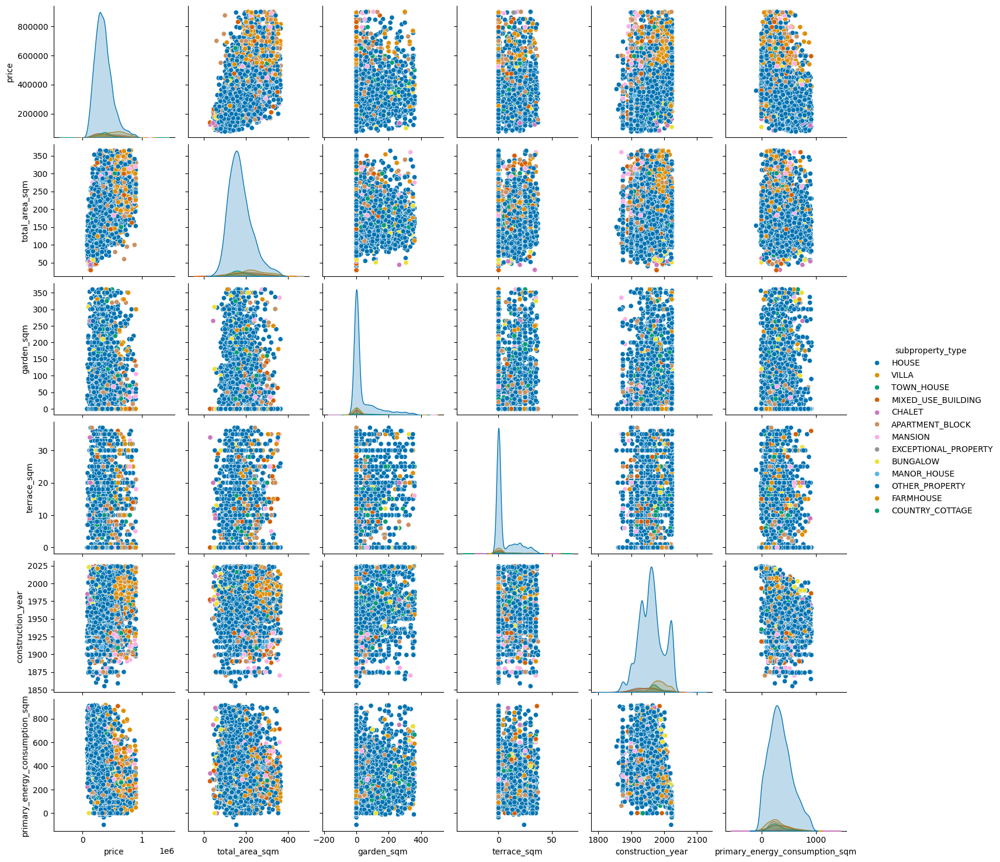

In [83]:
df = house_properties[["subproperty_type", "price", "total_area_sqm", "garden_sqm", "terrace_sqm", "construction_year", "primary_energy_consumption_sqm"]]
df_clean = remove_outliers(df, ["price", "total_area_sqm", "garden_sqm", "terrace_sqm", "construction_year", "primary_energy_consumption_sqm"])
sns.pairplot(df_clean, hue="subproperty_type", palette="colorblind")

<Axes: xlabel='state_building', ylabel='Count'>

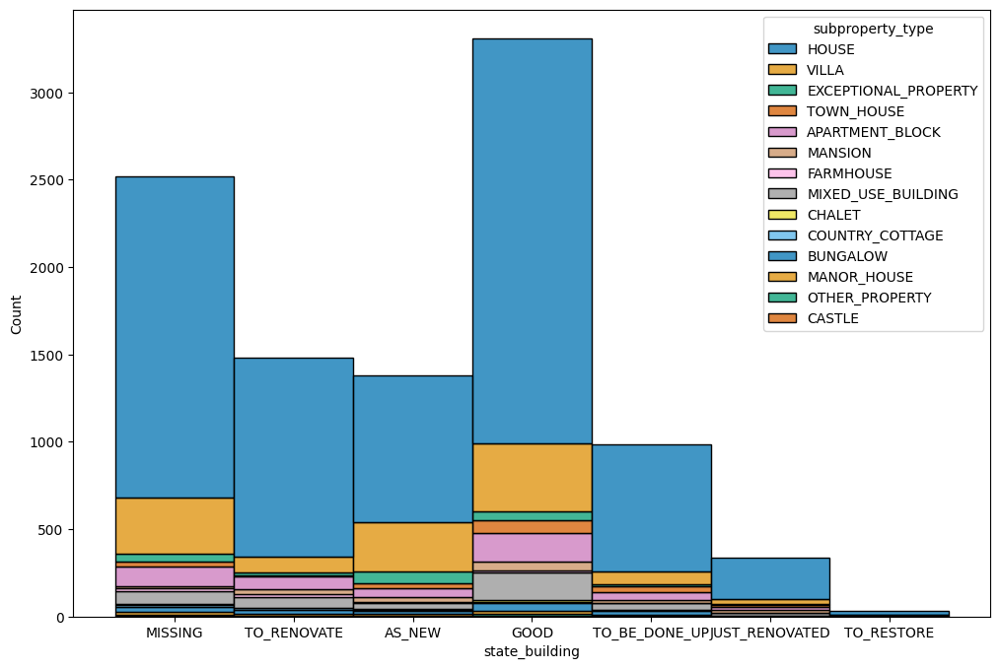

In [52]:
df = house_properties
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x="state_building", hue="subproperty_type", multiple="stack", palette="colorblind")

## Apartments

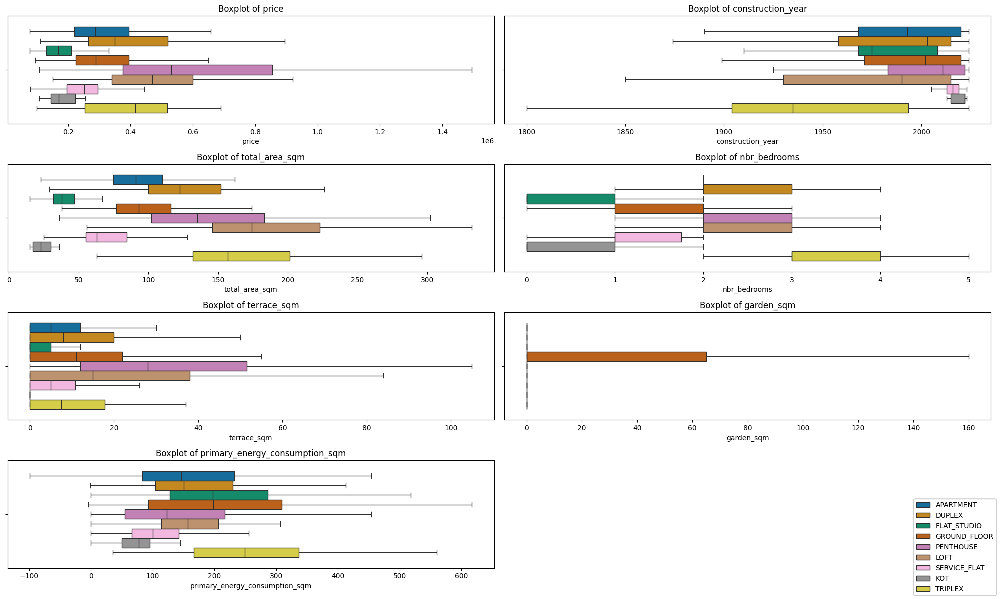

In [72]:
df = apartment_properties.select_dtypes(np.number)
df.pop("id")
df.pop("zip_code")
df.pop("fl_swimming_pool")
df.pop("fl_furnished")
df.pop("fl_open_fire")
df.pop("fl_floodzone")
df.pop("fl_double_glazing")
df["subproperty_type"] = apartment_properties["subproperty_type"]
plt.figure(figsize=(20, 12))
for i, col in enumerate(df.columns[:-1]):
    ax = plt.subplot(4, 2, i + 1)
    sns.boxplot(x=df[col], hue=df["subproperty_type"], ax=ax, palette="colorblind", showfliers=False)
    plt.title(f"Boxplot of {col}")
    handles, labels = ax.get_legend_handles_labels()
    plt.legend().remove()
    leg = plt.figlegend(handles, labels, loc='lower right')
plt.tight_layout()
plt.show()

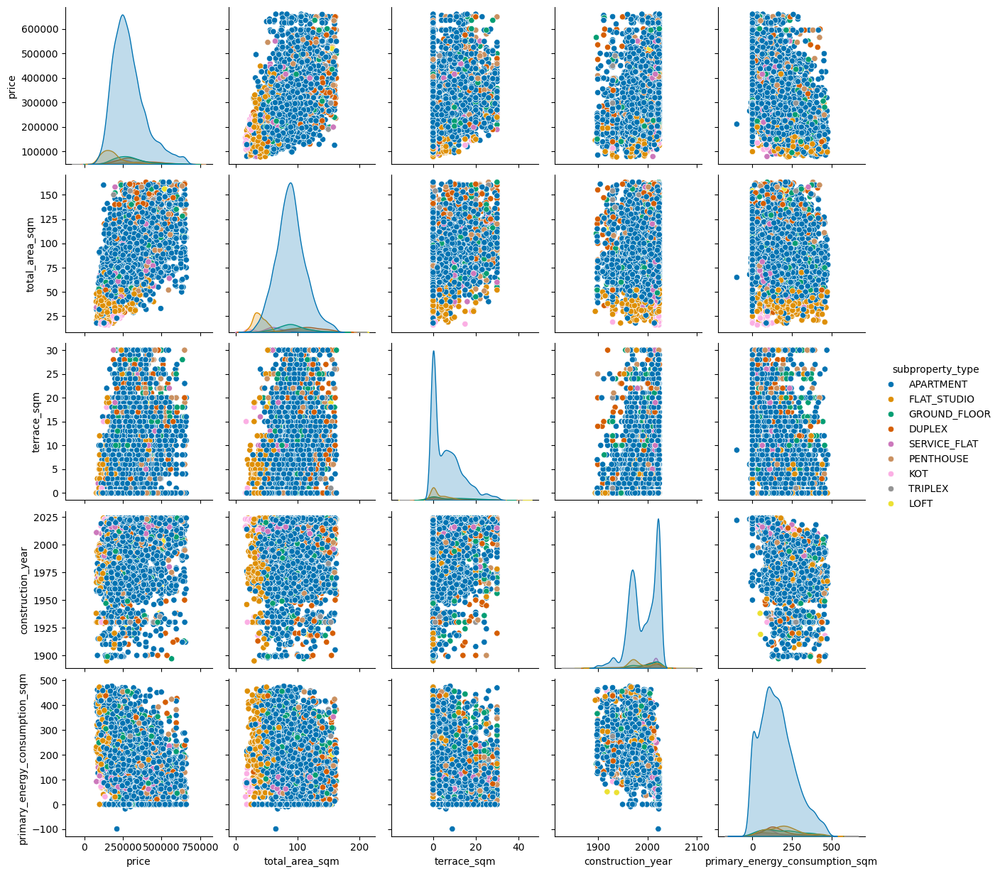

In [87]:
df = apartment_properties[["subproperty_type", "price", "total_area_sqm", "terrace_sqm", "construction_year", "primary_energy_consumption_sqm"]]
df_clean = remove_outliers(df, ["price", "total_area_sqm", "terrace_sqm", "construction_year", "primary_energy_consumption_sqm"])
sns.pairplot(df_clean, hue="subproperty_type", palette="colorblind")

<Axes: xlabel='state_building', ylabel='Count'>

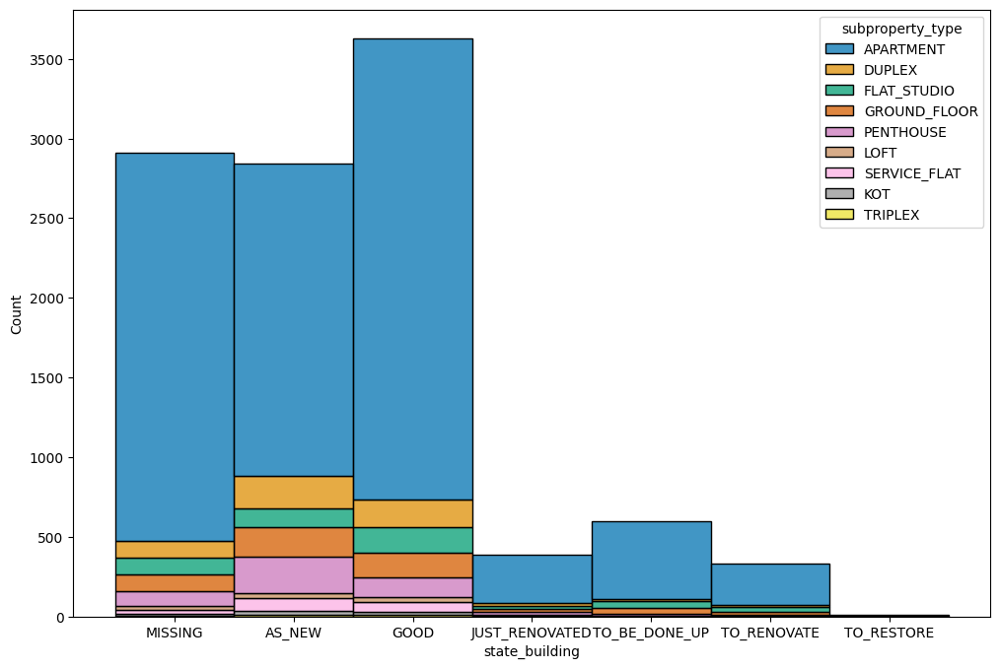

In [51]:
df = apartment_properties
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x="state_building", hue="subproperty_type", multiple="stack", palette="colorblind")

# How many qualitative and quantitative variables are there? How would you transform the qualitative values into numerical values?

Quantitative: price,total_area_sqm,nbr_bedrooms,terrace_sqm,garden_sqm,fl_,primary_energy_consumption_sqm : numeric, continuous

Qualitative: Nominal:id,property_type,subproperty_type,region,province,locality,zip_code,latitude,longitude,

Ordinal construction_year, equipped_kitchen, state_building

Binary fl_double_glazing, fl_furnished,fl_open_fire,fl_swimming_pool,fl_floodzone

Ordinal data will be converted using replace() and Nominal data will be replaced using Label encoding(sklearn, .cat.codes). One hot encoding can be used instead of label encoding so converted numerical data is not misinterpreted by the algorithm. Other methods to convert are frequency encoding, custom binary encoding.

# What is the correlation between the variables and the price? Why do you think some variables are more correlated than others?

In [135]:
x_axis_labels = ['Price','Zip Code','Construction Year','Total Area','No. Bedrooms','Furnished','Open Fire','Terrace','Garden','Swimming pool','Kitchen Level','Floodzone','Energy Consumption','Double Glazing'] # labels for x-axis
y_axis_labels = ['Price','Zip Code','Construction Year','Total Area','No. Bedrooms','Furnished','Open Fire','Terrace','Garden','Swimming pool','Kitchen Level','Floodzone','Energy Consumption','Double Glazing'] # labels for y-axis

mask = np.zeros_like(properties[['price','zip_code','construction_year','total_area_sqm','nbr_bedrooms','fl_furnished','fl_open_fire','terrace_sqm','garden_sqm','fl_swimming_pool','nr_equipped_kitchen','fl_floodzone','primary_energy_consumption_sqm','fl_double_glazing']].corr(method='spearman'), dtype=np.bool)
mask[np.triu_indices_from(mask,1)] = True
plt.figure(figsize=(10,10))
sns.heatmap(properties[['price','zip_code','construction_year','total_area_sqm','nbr_bedrooms','fl_furnished','fl_open_fire','terrace_sqm','garden_sqm','fl_swimming_pool','nr_equipped_kitchen','fl_floodzone','primary_energy_consumption_sqm','fl_double_glazing']].corr(method='spearman').round(3),
            vmin=-1,
            cmap='coolwarm',
            annot=True,
            mask = mask,
            linewidths=.5,
            annot_kws={"fontsize":8},
            xticklabels=x_axis_labels,
            yticklabels=y_axis_labels)

KeyError: "['nr_equipped_kitchen'] not in index"

In [91]:
#Transforming data into Ordinal
#Cleaning existing kitchen data
ord_house_data= properties.drop(properties[properties['equipped_kitchen'] == 'MISSING'].index)

#Assigning numeric values to kitchen categories
ord_house_data['nr_equipped_kitchen']=ord_house_data['equipped_kitchen'].replace(['SEMI_EQUIPPED','USA_SEMI_EQUIPPED','HYPER_EQUIPPED','USA_HYPER_EQUIPPED','INSTALLED','USA_INSTALLED','USA_UNINSTALLED','UNINSTALLED','NOT_INSTALLED'],[3,3,4,4,2,2,1,1,1])

#Cleaning existing state of building data
ord_house_data= ord_house_data.drop(ord_house_data[ord_house_data['state_building'] == 'MISSING'].index)

#Assigning numeric values to state of building categories
ord_house_data['nr_state_building']=ord_house_data['state_building'].replace(['AS_NEW','JUST_RENOVATED','GOOD','TO_BE_DONE_UP','TO_RESTORE','TO_RENOVATE'],[5,5,4,3,2,1])

C:\Users\zelim\AppData\Local\Temp\ipykernel_32564\4270503716.py:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ord_house_data['nr_equipped_kitchen']=ord_house_data['equipped_kitchen'].replace(['SEMI_EQUIPPED','USA_SEMI_EQUIPPED','HYPER_EQUIPPED','USA_HYPER_EQUIPPED','INSTALLED','USA_INSTALLED','USA_UNINSTALLED','UNINSTALLED','NOT_INSTALLED'],[3,3,4,4,2,2,1,1,1])
C:\Users\zelim\AppData\Local\Temp\ipykernel_32564\4270503716.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ord_house_data['nr_state_building']=ord_house_data['sta

<Axes: title={'center': 'Correlation between quantitative variables and price'}>

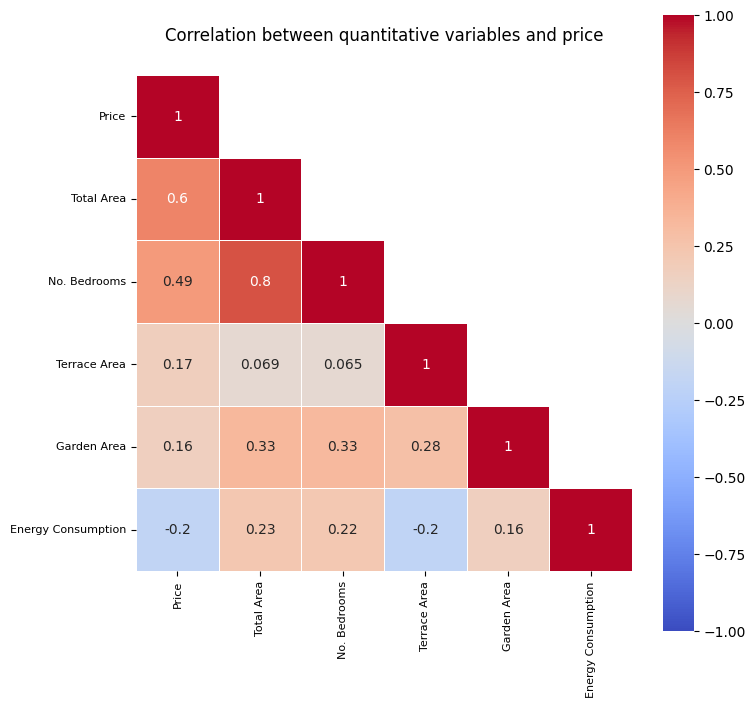

In [94]:
#Correlation between quantitative variables using a heatmap
x_axis_labels = ['Price','Total Area','No. Bedrooms','Terrace Area','Garden Area','Energy Consumption'] # labels for x-axis
y_axis_labels = ['Price','Total Area','No. Bedrooms','Terrace Area','Garden Area','Energy Consumption'] # labels for y-axis

mask = np.zeros_like(properties[['price','total_area_sqm','nbr_bedrooms','terrace_sqm','garden_sqm','primary_energy_consumption_sqm']].corr(method='spearman'), dtype=np.bool)
mask[np.triu_indices_from(mask,1)] = True
plt.figure(figsize=(8,8))
plt.title('Correlation between quantitative variables and price',pad=25)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

sns.heatmap(properties[['price','total_area_sqm','nbr_bedrooms','terrace_sqm','garden_sqm','primary_energy_consumption_sqm']].corr(method='spearman').round(3),
            vmin=-1,
            cmap='coolwarm',
            annot=True,
            mask = mask,
            linewidths=.5,
            annot_kws={"fontsize":10},
            xticklabels=x_axis_labels,
            yticklabels=y_axis_labels,
            square=True)


<Axes: title={'center': 'Correlation between ordinal variables and price'}>

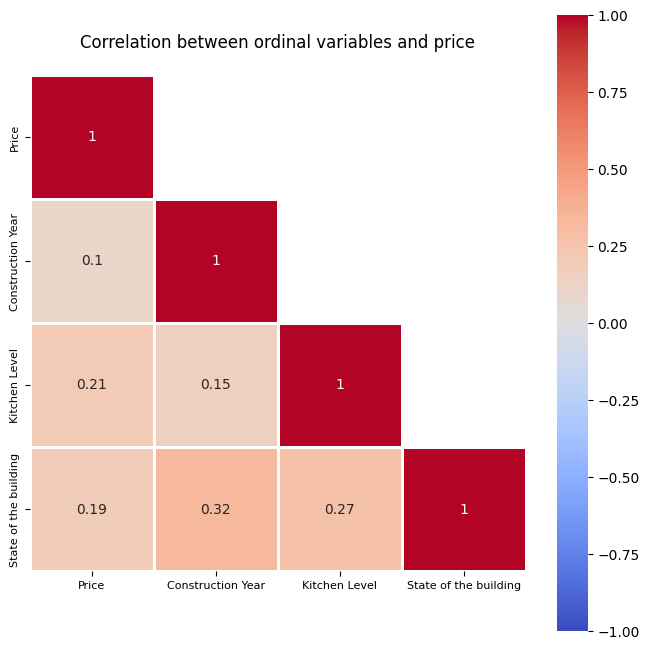

In [136]:
#Correlation between ordinal values and price
x_axis_labels = ['Price','Construction Year','Kitchen Level','State of the building'] # labels for x-axis
y_axis_labels = ['Price','Construction Year','Kitchen Level','State of the building'] # labels for y-axis

mask = np.zeros_like(ord_house_data[['price','construction_year','nr_equipped_kitchen','nr_state_building']].corr(method='kendall'), dtype=np.bool)
mask[np.triu_indices_from(mask,1)] = True
plt.figure(figsize=(8,8))
plt.title('Correlation between ordinal variables and price',pad=20)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

sns.heatmap(ord_house_data[['price','construction_year','nr_equipped_kitchen','nr_state_building']].corr(method='kendall').round(3),
            vmin=-1,
            cmap='coolwarm',
            annot=True,
            mask = mask,
            linewidths=2,
            annot_kws={"fontsize":10},
            xticklabels=x_axis_labels,
            yticklabels=y_axis_labels,
            square=True)


In [137]:
#Checking if price has a normal distribution
price_mean=properties['price'].mean()
#423189.3527059914
price_median=properties['price'].median()
#325000.0
std_dev_price=properties['price'].std()
#401253.5552963024

skewedness=3*((price_mean-price_median)/std_dev_price)
#0.73411949683649

#price is right skewed, transforming the price field by applying log(base = e)

apply_log=lambda x: math.log(x)
properties['log_price']=properties.price.apply(apply_log)

C:\Users\zelim\AppData\Local\Temp\ipykernel_32564\951247063.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['Double Glazing','Open Fire','Swimming Pool','Flood Zone'], y=corr_list[1:],palette=colors)
C:\Users\zelim\AppData\Local\Temp\ipykernel_32564\951247063.py:17: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.barplot(x=['Double Glazing','Open Fire','Swimming Pool','Flood Zone'], y=corr_list[1:],palette=colors)


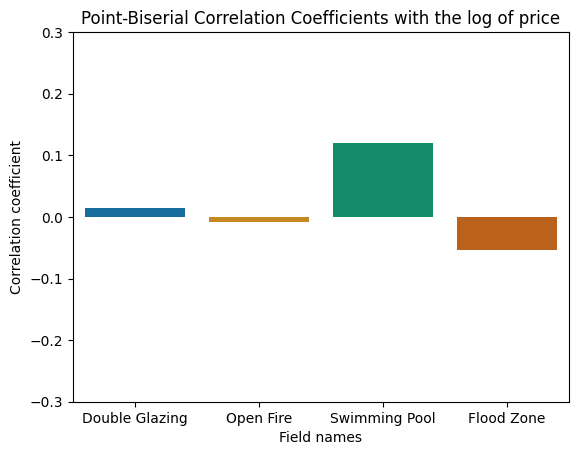

In [139]:
#Correlation between binary variables and price

corr_list = []
y = properties['log_price'].astype(float)

bin_types=properties[['log_price','fl_double_glazing','fl_open_fire','fl_swimming_pool','fl_floodzone']]
for column in bin_types:
    x=properties[column]
    corr = stats.pointbiserialr(list(x), list(y))
    corr_list.append(corr[0])


# Bar plot visualization
colors=sns.color_palette("colorblind")

#colors=get_colors(corr_list)
sns.barplot(x=['Double Glazing','Open Fire','Swimming Pool','Flood Zone'], y=corr_list[1:],palette=colors)
plt.title('Point-Biserial Correlation Coefficients with the log of price')
plt.ylabel('Correlation coefficient')
plt.xlabel('Field names')
plt.ylim([-0.3, 0.3])
plt.show()

In [142]:
# perform Welch's ANOVA for Nominal data

corr_anova = []
y = properties['log_price'].astype(float)

cat_types=properties[['log_price','property_type','subproperty_type','region','province','locality','zip_code']]
for column in cat_types:
    x=properties[column]
    corr = pg.welch_anova(dv='log_price', between=column, data=properties)
    corr_anova.append(format(corr['p-unc'].item(),'f'))

corr_anova

# Bar plot visualization, not very helpful as the coefficients are near zero for most of these values.
'''
colors=sns.color_palette("colorblind")
sns.barplot(x=['Property Type','Sub Property Type','Regoin','Province','Locality','Zipcode'], y=corr_anova[1:],palette=colors)
plt.title('Point-Biserial Correlation Coefficients with the log of price')
plt.ylabel('Correlation coefficient')
plt.xlabel('Field names')
plt.ylim([-0.3, 0.3])
plt.show()

# The p values for all categorical data except the zipcode is almost zero, the p value for zip codes is surprisingly 1
sns.scatterplot(data=house_data, x=house_data['zip_code'], y=house_data['log_price']
'''

c:\Users\zelim\Desktop\becode_projects\immo-eliza-team-5-analysis\.venv\Lib\site-packages\pingouin\parametric.py:1346: RuntimeWarning: invalid value encountered in scalar divide
  adj_grandmean = (weights * grp.mean(numeric_only=True)).sum() / weights.sum()
c:\Users\zelim\Desktop\becode_projects\immo-eliza-team-5-analysis\.venv\Lib\site-packages\pingouin\parametric.py:1358: RuntimeWarning: divide by zero encountered in scalar divide
  ddof2 = 1 / lamb
c:\Users\zelim\Desktop\becode_projects\immo-eliza-team-5-analysis\.venv\Lib\site-packages\pingouin\parametric.py:1346: RuntimeWarning: invalid value encountered in scalar divide
  adj_grandmean = (weights * grp.mean(numeric_only=True)).sum() / weights.sum()


'\ncolors=sns.color_palette("colorblind")\nsns.barplot(x=[\'Property Type\',\'Sub Property Type\',\'Regoin\',\'Province\',\'Locality\',\'Zipcode\'], y=corr_anova[1:],palette=colors)\nplt.title(\'Point-Biserial Correlation Coefficients with the log of price\')\nplt.ylabel(\'Correlation coefficient\')\nplt.xlabel(\'Field names\')\nplt.ylim([-0.3, 0.3])\nplt.show()\n\n# The p values for all categorical data except the zipcode is almost zero, the p value for zip codes is surprisingly 1\nsns.scatterplot(data=house_data, x=house_data[\'zip_code\'], y=house_data[\'log_price\']\n'

In [143]:
#Creating groups by region for further analysis
groups=properties.groupby("province")
flan=['Antwerp' , 'East Flanders', 'West Flanders','Limburg' ,'Flemish Brabant']
flanders=pd.concat([groups.get_group(name) for name in flan])
wall=['Walloon Brabant','Liège','Brussels', 'Hainaut' ,'Namur', 'Luxembourg']
wallonia=pd.concat([groups.get_group(name) for name in wall])

# How are the variables themselves correlated to each other? Can you find groups of variables that are correlated together?

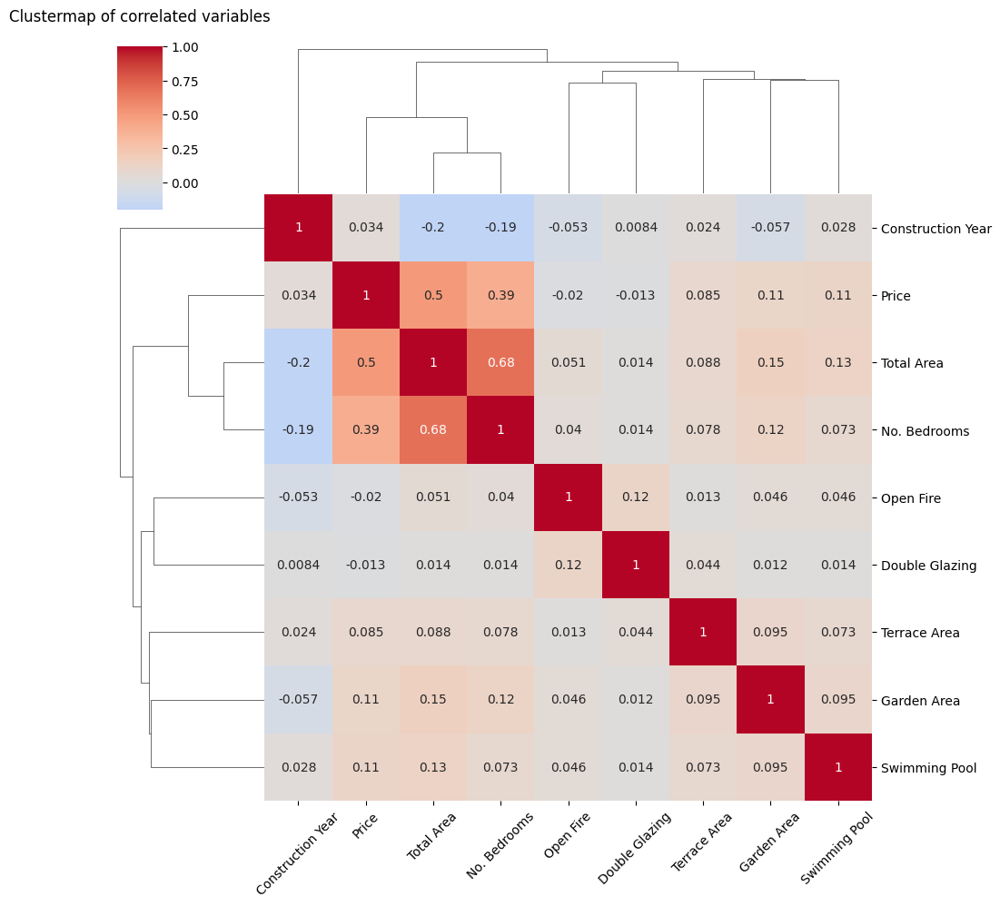

In [132]:
df = properties.select_dtypes(np.number)
df.pop("id")
df.pop("zip_code")
df.pop("latitude")
df.pop("longitude")
df.pop("fl_furnished")
df.pop("fl_floodzone")
df.pop("primary_energy_consumption_sqm")
df.pop("price_per_sqm")

corr_matrix = df.corr()

x_axis_labels = ["Construction Year", "Price","Total Area", "No. Bedrooms", "Open Fire", "Double Glazing", "Terrace Area", "Garden Area", "Swimming Pool"]
y_axis_labels = ["Construction Year", "Price","Total Area", "No. Bedrooms", "Open Fire", "Double Glazing", "Terrace Area", "Garden Area", "Swimming Pool"]

cluster = sns.clustermap(corr_matrix, annot=True, cmap="coolwarm", center=0, xticklabels=True, yticklabels=True)
cluster.ax_heatmap.set_xticklabels(x_axis_labels, rotation=45)
cluster.ax_heatmap.set_yticklabels(y_axis_labels)

plt.title("Clustermap of correlated variables", pad=20)
plt.show()

## Houses

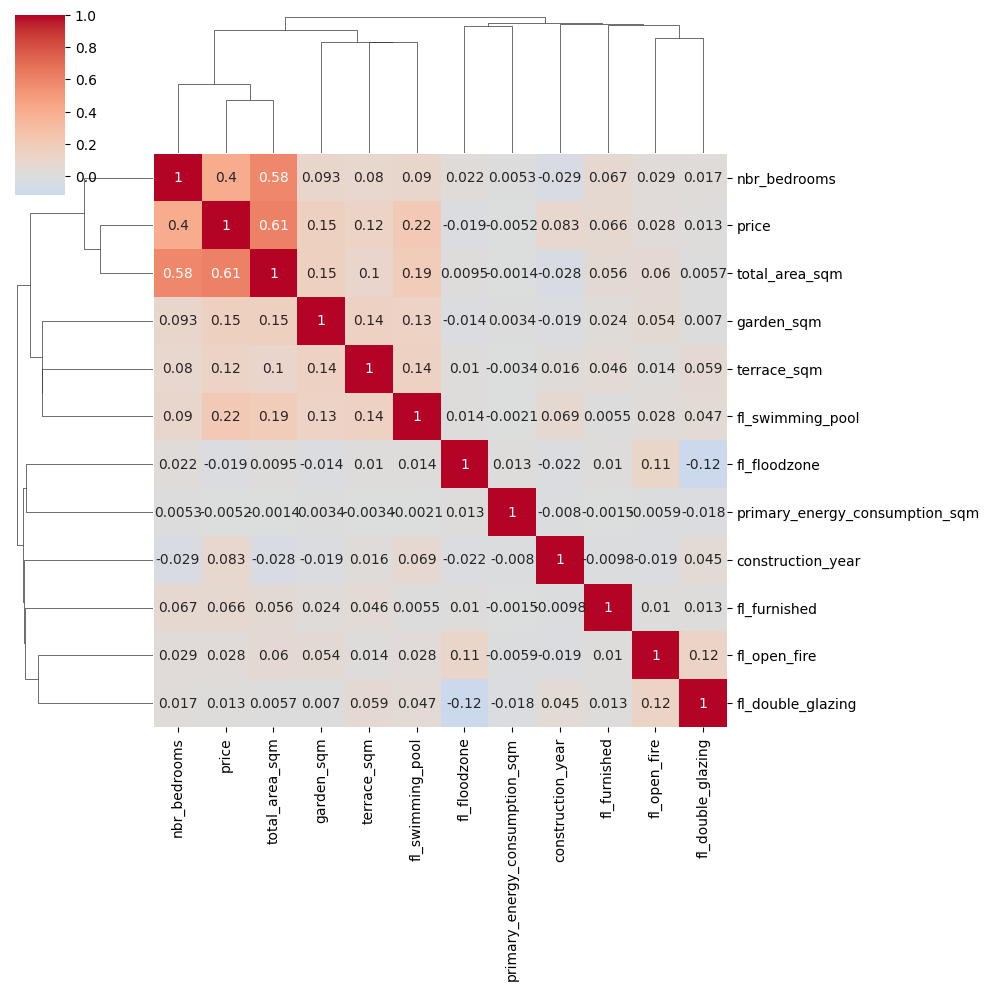

In [35]:
df = house_properties.select_dtypes(np.number)
df.pop("id")
df.pop("zip_code")
corr_matrix = df.corr()

sns.clustermap(corr_matrix, annot=True, cmap="coolwarm", center=0)

## Apartments

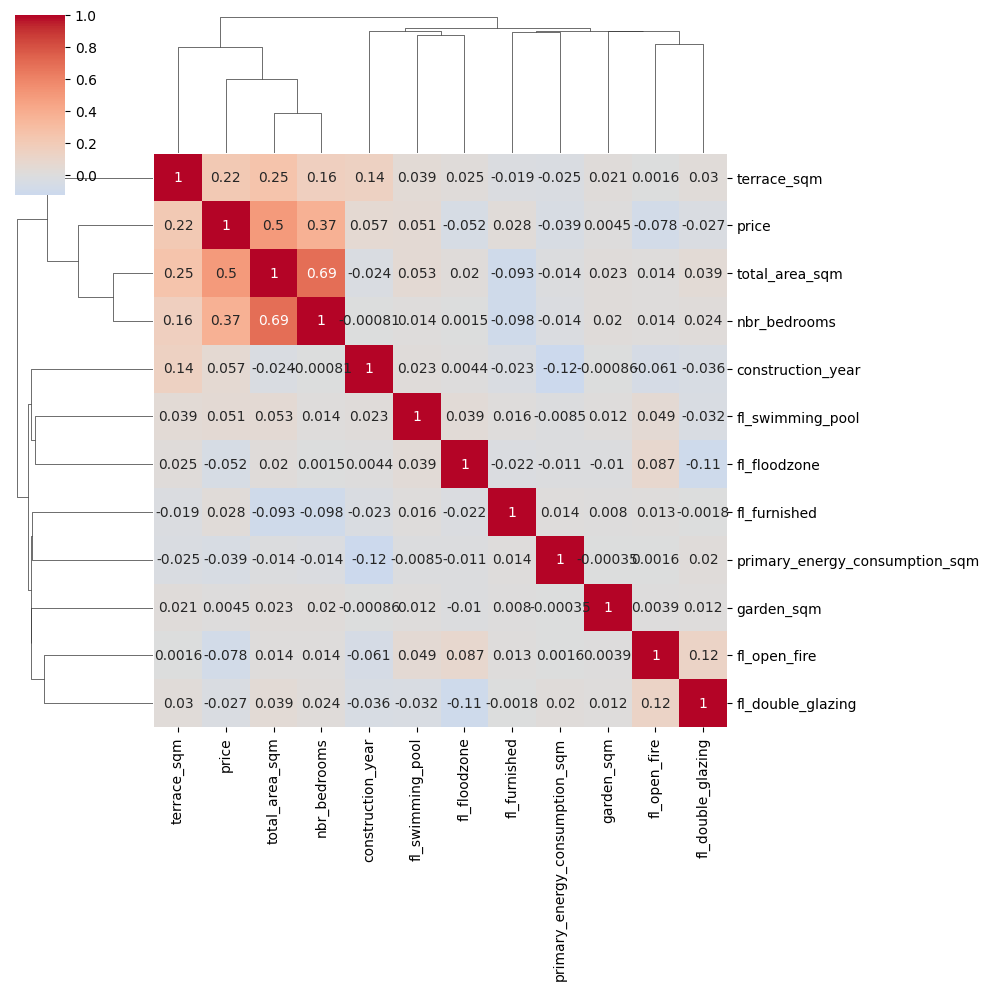

In [10]:
df = apartment_properties.select_dtypes(np.number)
df.pop("id")
df.pop("zip_code")
corr_matrix = df.corr()

sns.clustermap(corr_matrix, annot=True, cmap="coolwarm", center=0)

# How are the number of properties distributed according to their surface?

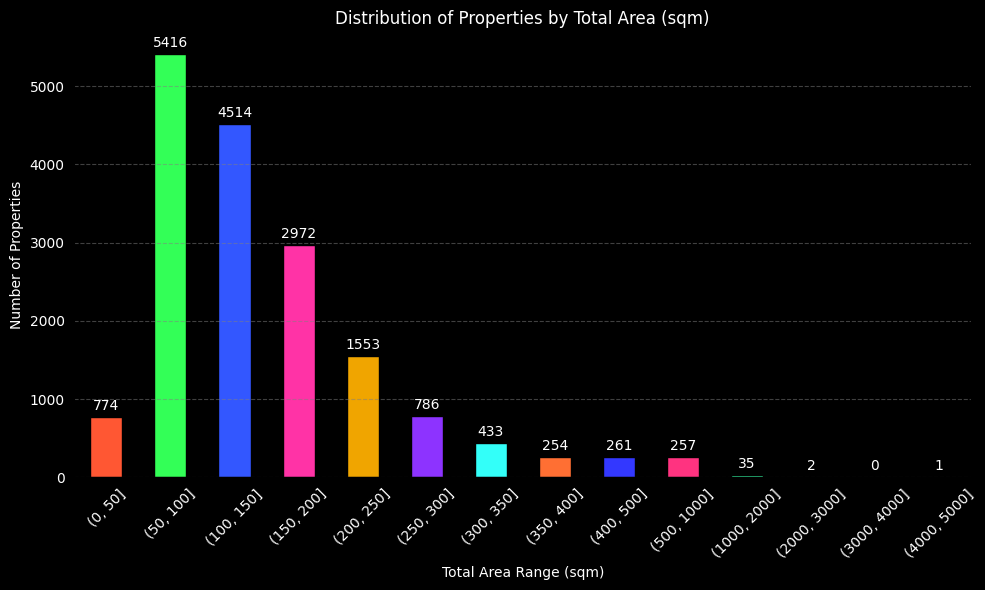

In [55]:
# list with any colors to use for the bars, we can get them from the internet 

custom_colors = [
    '#FF5733', '#33FF57', '#3357FF', '#FF33A6', '#F0A500', 
    '#8D33FF', '#33FFF9', '#FF6F33', '#3338FF', '#FF3380', 
    '#33FFA6', '#A633FF', '#FFB533', '#3377FF', '#FF338F'
]
#list of bins we used it to fit with our data range 
bins = [0, 50, 100, 150, 200, 250, 300, 350, 400, 500, 1000, 2000, 3000, 4000, 5000]
area_distribution = pd.cut(properties['total_area_sqm'], bins=bins).value_counts().sort_index()

plt.figure(figsize=(10, 6))

# Set the face color of the plot to black
ax = area_distribution.plot(kind='bar', color=custom_colors[:len(area_distribution)], edgecolor='black')
plt.gca().set_facecolor('black')  # Set the plot background to black

# Set the figure background color
plt.gcf().set_facecolor('black')


plt.title("Distribution of Properties by Total Area (sqm)", color='white')
plt.xlabel("Total Area Range (sqm)", color='white')
plt.ylabel("Number of Properties", color='white')
plt.xticks(rotation=45, color='white')
plt.yticks(color='white')

# Add value labels on each bar 
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=10, color='white', xytext=(0, 5), 
                textcoords='offset points')
# Change grid line color
plt.grid(axis='y', linestyle='--', alpha=0.5, color='gray') 
plt.tight_layout()
plt.show()

# Which five variables do you consider the most important and why?

Price, total_area_sqm, nbr_bedrooms, swimming_pool, garden_sqm

# What are the least/most expensive municipalities in Belgium/Wallonia/Flanders? (_in terms of price per m², average price, and median price_)

In [56]:
properties['price_per_sqm'] = properties['price'] / properties['total_area_sqm']
properties.price_per_sqm = properties.price_per_sqm.round(2)
properties.head()

,id,price,property_type,subproperty_type,region,province,locality,zip_code,latitude,longitude,...,fl_furnished,fl_open_fire,terrace_sqm,garden_sqm,fl_swimming_pool,fl_floodzone,state_building,primary_energy_consumption_sqm,fl_double_glazing,price_per_sqm
0,34221000,225000.0,APARTMENT,APARTMENT,Flanders,Antwerp,Antwerp,2050,51.217172,4.379982,...,0,0,5.0,0.0,0,0,MISSING,231.0,1,2250.00
1,58496000,501000.0,HOUSE,HOUSE,Flanders,Antwerp,Turnhout,2275,51.238312,4.817192,...,0,0,0.0,0.0,0,1,MISSING,99.0,0,2679.14
2,58028000,3500000.0,HOUSE,VILLA,Flanders,West Flanders,Brugge,8300,51.353323,3.296353,...,0,0,0.0,0.0,0,0,TO_RENOVATE,394.0,0,12635.38
3,10079000,549000.0,HOUSE,VILLA,Flanders,East Flanders,Dendermonde,9240,51.065914,3.987321,...,0,0,0.0,0.0,0,0,AS_NEW,142.0,1,2967.57
4,33039000,175000.0,APARTMENT,FLAT_STUDIO,Brussels-Capital,Brussels,Brussels,1160,50.822456,4.406917,...,0,0,0.0,0.0,0,0,GOOD,265.0,1,4605.26


## Belgium

In [60]:
municipalities_stats = properties.groupby('locality').agg(
    avg_price=('price', 'mean'),
    median_price=('price', 'median'),
    avg_price_per_sqm=('price_per_sqm', 'mean')).reset_index().round(2)


least_expensive_municipality_in_Belgium = municipalities_stats.nsmallest(5, 'avg_price_per_sqm')
most_expensive_municipality_in_Belgium = municipalities_stats.nlargest(5, 'avg_price_per_sqm')

In [61]:
# The least expensive municipality in Belgium
print(least_expensive_municipality_in_Belgium)

         locality  avg_price  median_price  avg_price_per_sqm
16          Ieper  315600.00      318000.0            1306.80
30  Philippeville  281125.00      247500.0            1542.21
7       Charleroi  300922.28      226793.0            1632.62
4        Bastogne  381860.66      299000.0            1771.59
3             Ath  326668.97      299000.0            1819.56


In [62]:
# the most expensive municipality in Belgium
print(most_expensive_municipality_in_Belgium)

    locality  avg_price  median_price  avg_price_per_sqm
5     Brugge  875030.68      545000.0            7180.76
40    Veurne  388909.62      315000.0            4140.62
6   Brussels  469542.60      375000.0            3776.02
28   Oostend  313984.85      279000.0            3367.89
12      Gent  450891.49      379000.0            3043.17


In [57]:
vis_spec = r"""{"config":[{"config":{"defaultAggregated":true,"geoms":["auto"],"coordSystem":"generic","limit":-1,"timezoneDisplayOffset":0},"encodings":{"dimensions":[{"fid":"property_type","name":"property_type","basename":"property_type","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"subproperty_type","name":"subproperty_type","basename":"subproperty_type","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"region","name":"region","basename":"region","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"province","name":"province","basename":"province","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"locality","name":"locality","basename":"locality","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"nbr_bedrooms","name":"nbr_bedrooms","basename":"nbr_bedrooms","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"equipped_kitchen","name":"equipped_kitchen","basename":"equipped_kitchen","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"fl_furnished","name":"fl_furnished","basename":"fl_furnished","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"fl_open_fire","name":"fl_open_fire","basename":"fl_open_fire","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"fl_swimming_pool","name":"fl_swimming_pool","basename":"fl_swimming_pool","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"fl_floodzone","name":"fl_floodzone","basename":"fl_floodzone","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"state_building","name":"state_building","basename":"state_building","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"fl_double_glazing","name":"fl_double_glazing","basename":"fl_double_glazing","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"fid":"id","name":"id","basename":"id","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"price","name":"price","basename":"price","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"zip_code","name":"zip_code","basename":"zip_code","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"construction_year","name":"construction_year","basename":"construction_year","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"total_area_sqm","name":"total_area_sqm","basename":"total_area_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"terrace_sqm","name":"terrace_sqm","basename":"terrace_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"garden_sqm","name":"garden_sqm","basename":"garden_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"primary_energy_consumption_sqm","name":"primary_energy_consumption_sqm","basename":"primary_energy_consumption_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"price_per_sqm","name":"price_per_sqm","basename":"price_per_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"fid":"price_per_sqm","name":"price_per_sqm","basename":"price_per_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"mean","offset":0}],"columns":[{"fid":"province","name":"province","basename":"province","semanticType":"nominal","analyticType":"dimension","offset":0,"sort":"ascending"}],"color":[{"fid":"province","name":"province","basename":"province","semanticType":"nominal","analyticType":"dimension","offset":0}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"fixed","width":627,"height":497},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_YC4S","name":"Chart 1"}],"chart_map":{},"workflow_list":[{"workflow":[{"type":"view","query":[{"op":"aggregate","groupBy":["province"],"measures":[{"field":"price_per_sqm","agg":"mean","asFieldKey":"price_per_sqm_mean"}]}]}]}],"version":"0.4.9.10"}"""
pyg.walk(properties, spec=vis_spec)

Box(children=(HTML(value='\n<div id="ifr-pyg-000625163e5bc0709fBxnYuev4hdwCcl" style="height: auto">\n    <hea…

## Flanders

In [63]:
flanders= properties[properties['region'] == 'Flanders']

flanders_municipalities_stats= flanders.groupby('locality').agg(
    avg_price=('price', 'mean'),
    median_price=('price', 'median'),
    avg_price_per_sqm=('price_per_sqm', 'mean')).reset_index().round(2)


least_expensive_municipality_in_flanders = flanders_municipalities_stats.nsmallest(5,'avg_price_per_sqm')
most_expensive_municipality_in_flanders = flanders_municipalities_stats.nlargest(5, 'avg_price_per_sqm')

In [64]:
# The least expensive municipality in flanders

print(least_expensive_municipality_in_flanders)

      locality  avg_price  median_price  avg_price_per_sqm
9        Ieper  315600.00      318000.0            1306.80
18       Tielt  314500.00      280000.0            1867.23
19    Tongeren  372350.34      298000.0            1917.39
4    Diksmuide  302274.03      272000.0            1927.43
15  Oudenaarde  322408.50      279000.0            2017.84


In [65]:
# The most expensive municipality in falnders 

print(most_expensive_municipality_in_flanders)

   locality  avg_price  median_price  avg_price_per_sqm
2    Brugge  875030.68      545000.0            7180.76
21   Veurne  388909.62      315000.0            4140.62
14  Oostend  313984.85      279000.0            3367.89
6      Gent  450891.49      379000.0            3043.17
1   Antwerp  381424.68      299000.0            2913.98


In [58]:
vis_spec = r"""{"config":[{"config":{"defaultAggregated":true,"geoms":["auto"],"coordSystem":"generic","limit":-1,"timezoneDisplayOffset":0},"encodings":{"dimensions":[{"fid":"property_type","name":"property_type","basename":"property_type","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"subproperty_type","name":"subproperty_type","basename":"subproperty_type","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"region","name":"region","basename":"region","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"province","name":"province","basename":"province","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"locality","name":"locality","basename":"locality","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"nbr_bedrooms","name":"nbr_bedrooms","basename":"nbr_bedrooms","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"equipped_kitchen","name":"equipped_kitchen","basename":"equipped_kitchen","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"fl_furnished","name":"fl_furnished","basename":"fl_furnished","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"fl_open_fire","name":"fl_open_fire","basename":"fl_open_fire","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"fl_swimming_pool","name":"fl_swimming_pool","basename":"fl_swimming_pool","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"fl_floodzone","name":"fl_floodzone","basename":"fl_floodzone","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"state_building","name":"state_building","basename":"state_building","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"fl_double_glazing","name":"fl_double_glazing","basename":"fl_double_glazing","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"fid":"id","name":"id","basename":"id","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"price","name":"price","basename":"price","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"zip_code","name":"zip_code","basename":"zip_code","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"construction_year","name":"construction_year","basename":"construction_year","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"total_area_sqm","name":"total_area_sqm","basename":"total_area_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"terrace_sqm","name":"terrace_sqm","basename":"terrace_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"garden_sqm","name":"garden_sqm","basename":"garden_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"primary_energy_consumption_sqm","name":"primary_energy_consumption_sqm","basename":"primary_energy_consumption_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"price_per_sqm","name":"price_per_sqm","basename":"price_per_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"fid":"price_per_sqm","name":"price_per_sqm","basename":"price_per_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"mean","offset":0}],"columns":[{"fid":"locality","name":"locality","basename":"locality","semanticType":"nominal","analyticType":"dimension","offset":0}],"color":[{"fid":"locality","name":"locality","basename":"locality","semanticType":"nominal","analyticType":"dimension","offset":0}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[{"fid":"id","name":"id","basename":"id","analyticType":"measure","semanticType":"quantitative","aggName":"count","offset":0}],"filters":[{"fid":"region","name":"region","basename":"region","semanticType":"nominal","analyticType":"dimension","offset":0,"rule":{"type":"one of","value":["Flanders"]}}],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_M-UM","name":"Chart 1"}],"chart_map":{},"workflow_list":[{"workflow":[{"type":"filter","filters":[{"fid":"region","rule":{"type":"one of","value":["Flanders"]}}]},{"type":"view","query":[{"op":"aggregate","groupBy":["locality"],"measures":[{"field":"price_per_sqm","agg":"mean","asFieldKey":"price_per_sqm_mean"},{"field":"id","agg":"count","asFieldKey":"id_count"}]}]}]}],"version":"0.4.9.10"}"""
pyg.walk(properties, spec=vis_spec)

Box(children=(HTML(value='\n<div id="ifr-pyg-0006251640c4f887jn1hfm5Bq3GuKeFL" style="height: auto">\n    <hea…

## Wallonia

In [66]:
Wallonia= properties[properties['region'] == 'Wallonia']

Wallonia_municipalities_stats= Wallonia.groupby('locality').agg(
    avg_price=('price', 'mean'),
    median_price=('price', 'median'),
    avg_price_per_sqm=('price_per_sqm', 'mean')).reset_index().round(2)


least_expensive_municipality_in_Wallonia = Wallonia_municipalities_stats.nsmallest(5,'avg_price_per_sqm' )
most_expensive_municipality_in_Wallonia= Wallonia_municipalities_stats.nlargest(5, 'avg_price_per_sqm')

In [67]:
# The least expensive municipality in Wallonia 

print(least_expensive_municipality_in_Wallonia)

         locality  avg_price  median_price  avg_price_per_sqm
13  Philippeville  281125.00      247500.0            1542.21
3       Charleroi  300922.28      226793.0            1632.62
2        Bastogne  381860.66      299000.0            1771.59
1             Ath  326668.97      299000.0            1819.56
11    Neufchâteau  258376.12      239000.0            1877.35


In [68]:
# The most expensive municipality in Wallonia 

print(most_expensive_municipality_in_Wallonia)

    locality  avg_price  median_price  avg_price_per_sqm
0      Arlon  332022.80      309000.0            2922.59
12  Nivelles  415300.86      350000.0            2918.03
9   Mouscron  267360.40      247750.0            2412.98
10     Namur  291854.19      280000.0            2406.32
16   Tournai  305265.36      225000.0            2305.02


In [59]:
vis_spec = r"""{"config":[{"config":{"defaultAggregated":true,"geoms":["bar"],"coordSystem":"generic","limit":-1,"timezoneDisplayOffset":0},"encodings":{"dimensions":[{"fid":"property_type","name":"property_type","basename":"property_type","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"subproperty_type","name":"subproperty_type","basename":"subproperty_type","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"region","name":"region","basename":"region","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"province","name":"province","basename":"province","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"locality","name":"locality","basename":"locality","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"nbr_bedrooms","name":"nbr_bedrooms","basename":"nbr_bedrooms","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"equipped_kitchen","name":"equipped_kitchen","basename":"equipped_kitchen","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"fl_furnished","name":"fl_furnished","basename":"fl_furnished","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"fl_open_fire","name":"fl_open_fire","basename":"fl_open_fire","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"fl_swimming_pool","name":"fl_swimming_pool","basename":"fl_swimming_pool","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"fl_floodzone","name":"fl_floodzone","basename":"fl_floodzone","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"state_building","name":"state_building","basename":"state_building","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"fl_double_glazing","name":"fl_double_glazing","basename":"fl_double_glazing","semanticType":"quantitative","analyticType":"dimension","offset":0},{"fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"fid":"id","name":"id","basename":"id","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"price","name":"price","basename":"price","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"zip_code","name":"zip_code","basename":"zip_code","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"construction_year","name":"construction_year","basename":"construction_year","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"total_area_sqm","name":"total_area_sqm","basename":"total_area_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"terrace_sqm","name":"terrace_sqm","basename":"terrace_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"garden_sqm","name":"garden_sqm","basename":"garden_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"primary_energy_consumption_sqm","name":"primary_energy_consumption_sqm","basename":"primary_energy_consumption_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"price_per_sqm","name":"price_per_sqm","basename":"price_per_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"fid":"price_per_sqm","name":"price_per_sqm","basename":"price_per_sqm","analyticType":"measure","semanticType":"quantitative","aggName":"mean","offset":0}],"columns":[{"fid":"locality","name":"locality","basename":"locality","semanticType":"nominal","analyticType":"dimension","offset":0}],"color":[{"fid":"locality","name":"locality","basename":"locality","semanticType":"nominal","analyticType":"dimension","offset":0}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[{"fid":"id","name":"id","basename":"id","analyticType":"measure","semanticType":"quantitative","aggName":"count","offset":0}],"filters":[{"fid":"region","name":"region","basename":"region","semanticType":"nominal","analyticType":"dimension","offset":0,"rule":{"type":"one of","value":["Wallonia"]}}],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_M-UM","name":"Chart 1"}],"chart_map":{},"workflow_list":[{"workflow":[{"type":"filter","filters":[{"fid":"region","rule":{"type":"one of","value":["Wallonia"]}}]},{"type":"view","query":[{"op":"aggregate","groupBy":["locality"],"measures":[{"field":"price_per_sqm","agg":"mean","asFieldKey":"price_per_sqm_mean"},{"field":"id","agg":"count","asFieldKey":"id_count"}]}]}]}],"version":"0.4.9.10"}"""
pyg.walk(properties, spec=vis_spec)

Box(children=(HTML(value='\n<div id="ifr-pyg-0006251642e745e9ZSnX0OcWdLeITl6M" style="height: auto">\n    <hea…